# Classification - Mini-Project 2

***Edit this cell with your name(s), tutorial number(s) and ID(s)***

---

Name: Hadeel Yasser 

ID:49-8371

Tutorial: 6

---

Name: Hania Elkhayat

ID:49-1150

Tutorial: 6

---


## Dataset Description

The data set includes information about:

- Customers who left within the last month – the column is called Churn
- Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies
- Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
- Demographic info about customers – gender, age range, and if they have partners and dependents

Each row represents a customer, and each column represents customer attributes as described below.

| Column | Description|
|-|-|
|gender|Whether the customer is a male or a female|
|SeniorCitizen| Whether the customer is a senior citizen or not (1, 0)|
|Partner|Whether the customer has a partner or not (Yes, No)|
|Dependents|Whether the customer has dependents or not (Yes, No)|
|tenure| Number of months the customer has stayed with the company|
|PhoneService|Whether the customer has a phone service or not (Yes, No)|
|MultipleLines|Whether the customer has multiple lines or not (Yes, No, No phone service*)|
|InternetService|Customer’s internet service provider (DSL, Fiber optic, No)|
|OnlineSecurity|Whether the customer has online security or not (Yes, No, No internet service**)|
|OnlineBackup|Whether the customer has online backup or not (Yes, No, No internet service)|
|DeviceProtection|Whether the customer has device protection or not (Yes, No, No internet service)|
|TechSupport|Whether the customer has tech support or not (Yes, No, No internet service)|
|StreamingTV|Whether the customer has streaming TV or not (Yes, No, No internet service) |
|StreamingMovies|Whether the customer has streaming movies or not (Yes, No, No internet service)|
|Contract|The contract term of the customer (Month-to-month, One year, Two year)|
|PaperlessBilling|Whether the customer has paperless billing or not (Yes, No)|
|PaymentMethod|The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))|
|MonthlyCharges|The amount charged to the customer monthly|
|TotalCharges|The total amount charged to the customer|
|Churn|Whether the customer churned or not (Yes or No)|

\* No phone service means the customer's plan does not include calling (could be a data-only plan)

\*\* No internet service means the customer's plan does not include internet/data and so the addon package does not apply

## Importing Libraries & Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
plt.style.use("seaborn")

df = pd.read_csv('https://raw.githubusercontent.com/GUC-DM/W2022/main/data/telecom_churn.csv')

df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,$29.85/m,$29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,$56.95/m,$1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,$53.85/m,$108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),$42.3/m,$1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,$70.7/m,$151.65,Yes


## Data Inspection

In [ ]:
#to view the last 10 tuples
df.tail(10)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7022,9767-FFLEM,Male,0,No,No,38,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Credit card (automatic),$69.5/m,$2625.25,No
7023,0639-TSIQW,Female,0,No,No,67,Yes,Yes,Fiber optic,Yes,...,Yes,No,Yes,No,Month-to-month,Yes,Credit card (automatic),$102.95/m,NaN,Yes
7024,8456-QDAVC,Male,0,No,No,19,Yes,No,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Bank transfer (automatic),$78.7/m,$1495.1,No
7025,7750-EYXWZ,Female,0,No,No,12,No,No phone service,DSL,No,...,Yes,Yes,Yes,Yes,One year,No,Electronic check,$60.65/m,$743.3,No
7026,2569-WGERO,Female,0,No,No,72,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,Yes,Bank transfer (automatic),$21.15/m,NaN,No
7027,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,$84.8/m,$1990.5,No
7028,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),$103.2/m,$7362.9,No
7029,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,$29.6/m,$346.45,No
7030,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,$74.4/m,$306.6,Yes
7031,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),$105.65/m,$6844.5,No


In [ ]:
#checking if there are any null values
df.isnull().sum()

customerID           56
gender                0
SeniorCitizen         0
Partner               0
Dependents            0
tenure                0
PhoneService          0
MultipleLines         0
InternetService       0
OnlineSecurity        0
OnlineBackup          0
DeviceProtection      0
TechSupport           0
StreamingTV           0
StreamingMovies       0
Contract              0
PaperlessBilling      0
PaymentMethod         0
MonthlyCharges        0
TotalCharges        852
Churn                 0
dtype: int64

In [ ]:
# data type of each variable/dimension
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        6976 non-null   object
 1   gender            7032 non-null   object
 2   SeniorCitizen     7032 non-null   int64 
 3   Partner           7032 non-null   object
 4   Dependents        7032 non-null   object
 5   tenure            7032 non-null   int64 
 6   PhoneService      7032 non-null   object
 7   MultipleLines     7032 non-null   object
 8   InternetService   7032 non-null   object
 9   OnlineSecurity    7032 non-null   object
 10  OnlineBackup      7032 non-null   object
 11  DeviceProtection  7032 non-null   object
 12  TechSupport       7032 non-null   object
 13  StreamingTV       7032 non-null   object
 14  StreamingMovies   7032 non-null   object
 15  Contract          7032 non-null   object
 16  PaperlessBilling  7032 non-null   object
 17  PaymentMethod 

In [ ]:
# statistical information about the dataset
df.describe()

,SeniorCitizen,tenure
count,7032.000000,7032.000000
mean,0.162400,32.421786
std,0.368844,24.545260
min,0.000000,1.000000
25%,0.000000,9.000000
50%,0.000000,29.000000
75%,0.000000,55.000000
max,1.000000,72.000000


In [ ]:
# to know the number of unique values in each column, the most common value and its frequency
# most common is the top value
df.describe(include='all')

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
count,6976,7032,7032.000000,7032,7032,7032.000000,7032,7032,7032,7032,...,7032,7032,7032,7032,7032,7032,7032,7032,6180,7032
unique,6976,2,NaN,2,2,NaN,2,3,3,3,...,3,3,3,3,3,2,4,1584,5783,2
top,7590-VHVEG,Male,NaN,No,No,NaN,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,$20.05/m,$20.2,No
freq,1,3549,NaN,3639,4933,NaN,6352,3385,3096,3497,...,3094,3472,2809,2781,3875,4168,2365,61,8,5163
mean,NaN,NaN,0.162400,NaN,NaN,32.421786,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.368844,NaN,NaN,24.545260,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,0.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,0.000000,NaN,NaN,9.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,0.000000,NaN,NaN,29.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,0.000000,NaN,NaN,55.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# checking the unique values in Senior Citizen
df['SeniorCitizen'].unique()

array([0, 1])

In [ ]:
# checking the unique values in Payment Method
df['PaymentMethod'].unique()

array(['Electronic check', 'Mailed check', 'Bank transfer (automatic)',
       'Credit card (automatic)'], dtype=object)

In [ ]:
#inspecting the number of unique values of each column to check if there are redundant variables (No of unique values = 1 or No of unique values = No of rows)
for column in df.columns:
    print(f"{column}: Number of unique values {df[column].nunique()}")
    print("==========================================================")

customerID: Number of unique values 6976
gender: Number of unique values 2
SeniorCitizen: Number of unique values 2
Partner: Number of unique values 2
Dependents: Number of unique values 2
tenure: Number of unique values 72
PhoneService: Number of unique values 2
MultipleLines: Number of unique values 3
InternetService: Number of unique values 3
OnlineSecurity: Number of unique values 3
OnlineBackup: Number of unique values 3
DeviceProtection: Number of unique values 3
TechSupport: Number of unique values 3
StreamingTV: Number of unique values 3
StreamingMovies: Number of unique values 3
Contract: Number of unique values 3
PaperlessBilling: Number of unique values 2
PaymentMethod: Number of unique values 4
MonthlyCharges: Number of unique values 1584
TotalCharges: Number of unique values 5783
Churn: Number of unique values 2


## Data Cleaning


In [ ]:
#Changing datatype of senior citizen from numeric to categorical (object)
df['SeniorCitizen']=df['SeniorCitizen'].astype(object)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        6976 non-null   object
 1   gender            7032 non-null   object
 2   SeniorCitizen     7032 non-null   object
 3   Partner           7032 non-null   object
 4   Dependents        7032 non-null   object
 5   tenure            7032 non-null   int64 
 6   PhoneService      7032 non-null   object
 7   MultipleLines     7032 non-null   object
 8   InternetService   7032 non-null   object
 9   OnlineSecurity    7032 non-null   object
 10  OnlineBackup      7032 non-null   object
 11  DeviceProtection  7032 non-null   object
 12  TechSupport       7032 non-null   object
 13  StreamingTV       7032 non-null   object
 14  StreamingMovies   7032 non-null   object
 15  Contract          7032 non-null   object
 16  PaperlessBilling  7032 non-null   object
 17  PaymentMethod 

In [ ]:
df['SeniorCitizen'].unique()

array([0, 1], dtype=object)

In [ ]:
#Removing $ and '/m' in the monthlyCharges column as well as renaming the column
df['MonthlyCharges']=df['MonthlyCharges'].str.replace('$','')
df['MonthlyCharges']=df['MonthlyCharges'].str.replace('/m','')
df.columns = df.columns.str.replace('MonthlyCharges', 'MonthlyCharges in dollars')


<ipython-input-225-697696f7e6a3>:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['MonthlyCharges']=df['MonthlyCharges'].str.replace('$','')


In [ ]:
#displaying the change
df['MonthlyCharges in dollars']

0        29.85
1        56.95
2        53.85
3         42.3
4         70.7
         ...  
7027      84.8
7028     103.2
7029      29.6
7030      74.4
7031    105.65
Name: MonthlyCharges in dollars, Length: 7032, dtype: object

In [ ]:
#Removing $ and '/m' in the TotalCharges column
df['TotalCharges']=df['TotalCharges'].str.replace('$','')
df['TotalCharges']=df['TotalCharges'].str.replace('/m','')

<ipython-input-227-ad7574aa670a>:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['TotalCharges']=df['TotalCharges'].str.replace('$','')


In [ ]:
# converting the datatype of monthlyCharges and totalCharges from object to float
df['MonthlyCharges in dollars']=df['MonthlyCharges in dollars'].astype(float)
df['TotalCharges']=df['TotalCharges'].astype(float)

In [ ]:
df.head(20)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in dollars,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.90,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,...,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [ ]:
# filling the null values in total charges with zeros to be replaced in the next step
df['TotalCharges'] = df['TotalCharges'].fillna(0)

In [ ]:
#Filling the TotalCharges by computing the product of tenure with monthly charges
for i, j in df.iterrows():
    if (j['TotalCharges']) == 0.0:
      newValue = j['tenure'] * j['MonthlyCharges in dollars']    
      df.loc[i,'TotalCharges'] = newValue

In [ ]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in dollars,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
#viewing null values in total charges
df.isnull().sum()

customerID                   56
gender                        0
SeniorCitizen                 0
Partner                       0
Dependents                    0
tenure                        0
PhoneService                  0
MultipleLines                 0
InternetService               0
OnlineSecurity                0
OnlineBackup                  0
DeviceProtection              0
TechSupport                   0
StreamingTV                   0
StreamingMovies               0
Contract                      0
PaperlessBilling              0
PaymentMethod                 0
MonthlyCharges in dollars     0
TotalCharges                  0
Churn                         0
dtype: int64

In [ ]:
# dropping the unneeded column
df= df.drop('customerID',axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   gender                     7032 non-null   object 
 1   SeniorCitizen              7032 non-null   object 
 2   Partner                    7032 non-null   object 
 3   Dependents                 7032 non-null   object 
 4   tenure                     7032 non-null   int64  
 5   PhoneService               7032 non-null   object 
 6   MultipleLines              7032 non-null   object 
 7   InternetService            7032 non-null   object 
 8   OnlineSecurity             7032 non-null   object 
 9   OnlineBackup               7032 non-null   object 
 10  DeviceProtection           7032 non-null   object 
 11  TechSupport                7032 non-null   object 
 12  StreamingTV                7032 non-null   object 
 13  StreamingMovies            7032 non-null   objec

In [ ]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in dollars,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Exploratory Data Analysis

**Q1: What are the most correlated attributes with customer churn?**

In [ ]:
#Creating an array with all the categorical variables 
temp = df.copy()
categorical_col = []
for column in temp.columns:
    if temp[column].dtype == object:
        categorical_col.append(column)

In [ ]:
print(categorical_col)

['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn']


In [ ]:
# converting the categorical columns to numeric through one hot encoding 
temp = pd.get_dummies(data=temp,
                           columns=categorical_col,
                           drop_first=False,
                           dtype='int8')
temp.head()

,tenure,MonthlyCharges in dollars,TotalCharges,gender_Female,gender_Male,SeniorCitizen_0,SeniorCitizen_1,Partner_No,Partner_Yes,Dependents_No,...,Contract_One year,Contract_Two year,PaperlessBilling_No,PaperlessBilling_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn_No,Churn_Yes
0,1,29.85,29.85,1,0,1,0,0,1,1,...,0,0,0,1,0,0,1,0,1,0
1,34,56.95,1889.50,0,1,1,0,1,0,1,...,1,0,1,0,0,0,0,1,1,0
2,2,53.85,108.15,0,1,1,0,1,0,1,...,0,0,0,1,0,0,0,1,0,1
3,45,42.30,1840.75,0,1,1,0,1,0,1,...,1,0,1,0,1,0,0,0,1,0
4,2,70.70,151.65,1,0,1,0,1,0,1,...,0,0,0,1,0,0,1,0,0,1


In [ ]:
#storing all the correlations between the variables in another variable
corr = temp.corr()

In [ ]:
# projecting on the churn yes column only to find its correlation with the independent variables
corr_YES = corr['Churn_Yes'].sort_values(ascending=False, key=lambda x: x.abs())
corr_YES

Churn_No                                  -1.000000
Churn_Yes                                  1.000000
Contract_Month-to-month                    0.404565
tenure                                    -0.354049
OnlineSecurity_No                          0.342235
TechSupport_No                             0.336877
InternetService_Fiber optic                0.307463
Contract_Two year                         -0.301552
PaymentMethod_Electronic check             0.301455
OnlineBackup_No                            0.267595
DeviceProtection_No                        0.252056
StreamingMovies_No internet service       -0.227578
StreamingTV_No internet service           -0.227578
TechSupport_No internet service           -0.227578
OnlineBackup_No internet service          -0.227578
InternetService_No                        -0.227578
DeviceProtection_No internet service      -0.227578
OnlineSecurity_No internet service        -0.227578
TotalCharges                              -0.199512
MonthlyCharg

**Visualization**

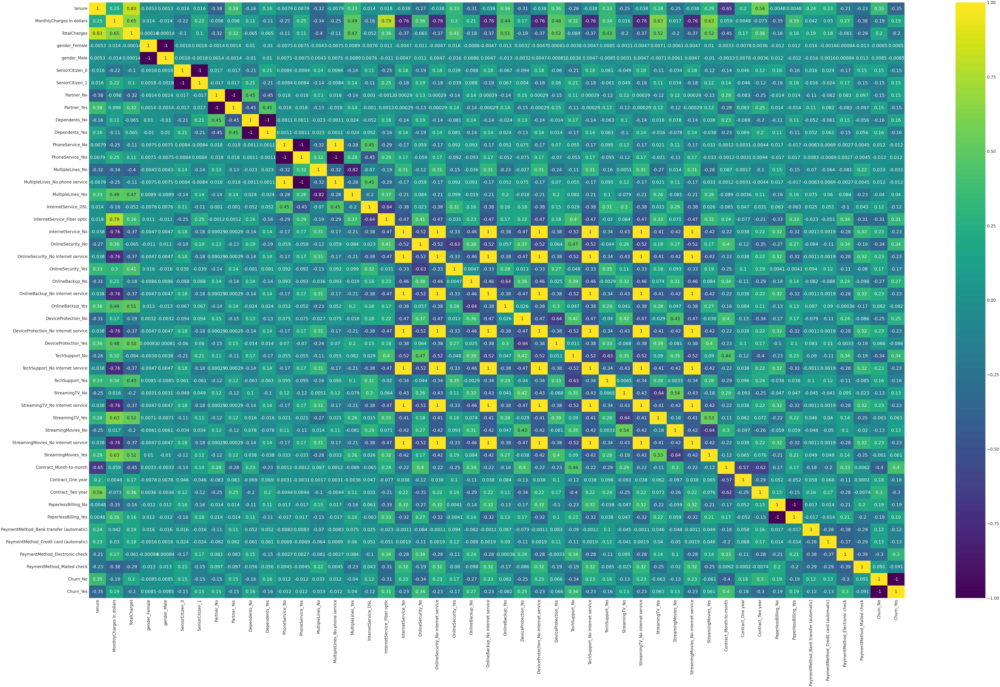

In [ ]:
# plotting the correlation using a heat map
plt.figure(figsize = (150,90))
sns.set(font_scale=3)
sns.heatmap(corr, cmap='viridis', annot = True);

**Answer for Q1**: Contract type which is month-to-month is the most correlated variable to churn. When the contract is month to month, churn rate is increased by 0.4. This means they are positively correlated

The second most variable is tenure. When the tenure increases by 1 the churn rate decreases by 0.3. This means they are negatively correlated 

No Online Security variable is the third most attribute correlated with churning. When there's no online security, customer churn increases by 0.34. 


**Q2: Which payment method has the highest churn rate?**

**Visualization**

In [ ]:
# encoding churn only to be numeric for plotting purposes on a copy of the data set
visualDf=df.copy()
visualDf = pd.get_dummies(visualDf, columns=['Churn'])


In [ ]:
visualDf.head(5)


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in dollars,TotalCharges,Churn_No,Churn_Yes
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,1,0
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,No,No,No,One year,No,Mailed check,56.95,1889.50,1,0
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,0,1
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,1,0
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,0,1


In [ ]:
#filtering the Churn_yes to only include YES=1 to have one boxplot 
counter=0
for cell in visualDf['Churn_Yes']:
  if cell == 0:
    visualDf.drop(counter, axis=0, inplace=True)
  counter+=1

In [ ]:
visualDf.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in dollars,TotalCharges,Churn_No,Churn_Yes
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,0,1
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,0,1
5,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,...,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,0,1
8,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,...,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,0,1
13,Male,0,No,No,49,Yes,Yes,Fiber optic,No,Yes,...,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.30,0,1


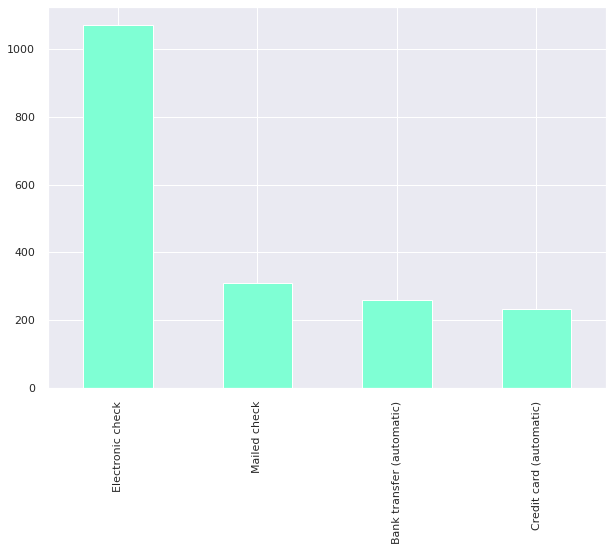

In [ ]:
#plotting payment methods count based on churning customers
plt.figure(figsize = (10,7))
sns.set(font_scale=1)
visualDf['PaymentMethod'].value_counts().plot(kind='bar',color='aquamarine')


**Answer for Q2**: The payment method with the highest churn rate as shown by the bar plot is electronic check

**Q3: After how many months do customers commonly churn?** (Hint: show and interpret the distribution)

**Visualization**

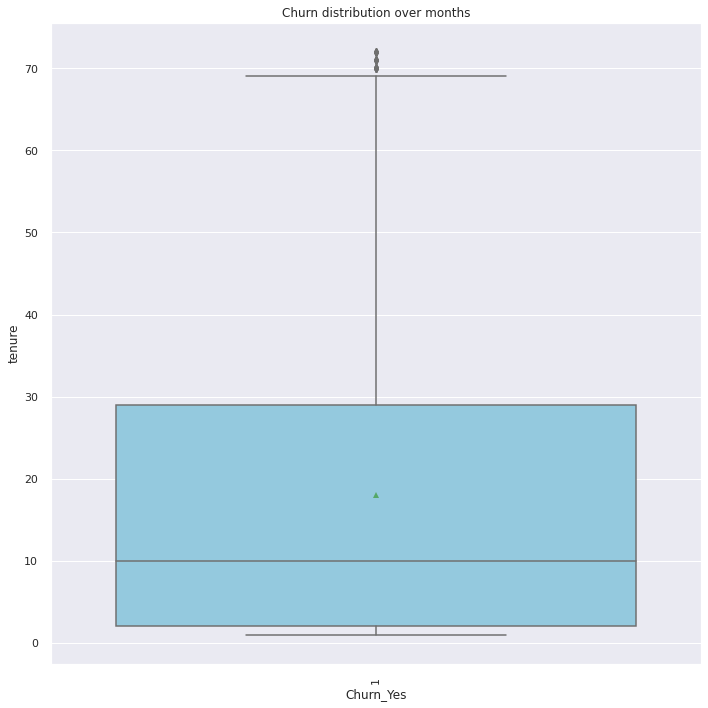

In [ ]:
#Plotting box plot with mean
plt.figure(figsize = (10,10))
sns.set(font_scale=1)
bp=sns.boxplot(x='Churn_Yes', y='tenure', data=visualDf, color='skyblue', showmeans=True).set(title='Churn distribution over months')
plt.xticks(rotation=90)
plt.tight_layout()

In [ ]:
#Calculating mean,median, lower quartile, upper quartile
mean = visualDf['tenure'].mean()
median = np.median(visualDf['tenure'])
upper_quartile = np.percentile(visualDf['tenure'], 75) 
lower_quartile = np.percentile(visualDf['tenure'], 25)

iqr = upper_quartile - lower_quartile
upper_whisker = visualDf['tenure'][visualDf['tenure']<= (upper_quartile+1.5*iqr)].max()
lower_whisker = visualDf['tenure'][visualDf['tenure']>=(lower_quartile-1.5*iqr)].min()

In [ ]:
print("Mean: ",mean)
print("Median: ",median)
print("Upper quartile: ",upper_quartile)
print("Lower quartile: ",lower_quartile)
print("Upper whisker: ",upper_whisker)
print("Lower whisker: ",lower_whisker)

Mean:  17.979133226324237
Median:  10.0
Upper quartile:  29.0
Lower quartile:  2.0
Upper whisker:  69
Lower whisker:  1


**Answer for Q3**: From the data visualization, the most commonly month customers commonly churn according to mean is 18 months.

As viewed by the boxplot, 
25% of the customers do churn after 2 months 

50% of the customers do churn after 10 months 

75% of the customers do churn after 29 months 




## Data Preparation for Modelling

In [ ]:
df_encoded=df.copy()

In [ ]:
#Converting Contract to ordinal variable
df_encoded['Contract'] =pd.Categorical(df_encoded['Contract'],
                                      categories=['Month-to-month', 'One year', 'Two year'],
                                      ordered=True)

#Label encoding the ordinal variable
df_encoded['Contract']=df_encoded['Contract'].astype('category').cat.codes

#Label encoding the dependent variable 
df_encoded['Churn']=df_encoded['Churn'].astype('category').cat.codes
df_encoded.head(20)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in dollars,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,0,Yes,Electronic check,29.85,29.85,0
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,1,No,Mailed check,56.95,1889.50,0
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,0,Yes,Mailed check,53.85,108.15,1
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,1,No,Bank transfer (automatic),42.30,1840.75,0
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,0,Yes,Electronic check,70.70,151.65,1
5,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,0,Yes,Electronic check,99.65,820.50,1
6,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,0,Yes,Credit card (automatic),89.10,1949.40,0
7,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,0,No,Mailed check,29.75,301.90,0
8,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,0,Yes,Electronic check,104.80,3046.05,1
9,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,1,No,Bank transfer (automatic),56.15,3487.95,0


In [ ]:
# removing outliers based on the upper whisker calculated above
counter=0
for cell in df_encoded['tenure']:
  if cell > 69:
    df_encoded.drop(counter, axis=0, inplace=True)
  counter+=1

In [ ]:
# checking if outliers were removed
df_encoded['tenure'].unique()

array([ 1, 34,  2, 45,  8, 22, 10, 28, 62, 13, 16, 58, 49, 25, 69, 52, 21,
       12, 30, 47, 17, 27,  5, 46, 11, 63, 43, 15, 60, 18, 66,  9,  3, 31,
       50, 64, 56,  7, 42, 35, 48, 29, 65, 38, 68, 32, 55, 37, 36, 41,  6,
        4, 33, 67, 23, 57, 61, 14, 20, 53, 40, 59, 24, 44, 19, 54, 51, 26,
       39])

In [ ]:
#removing Contract as it is already encoded 
categorical_col.remove('Contract')

In [ ]:
#removing Churn as it is already encoded 
categorical_col.remove('Churn')

In [ ]:
#encoding the rest of the categorical columns using one hot 

df_encoded = pd.get_dummies(df_encoded, columns=categorical_col)
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6381 entries, 0 to 7031
Data columns (total 45 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   tenure                                   6381 non-null   int64  
 1   Contract                                 6381 non-null   int8   
 2   MonthlyCharges in dollars                6381 non-null   float64
 3   TotalCharges                             6381 non-null   float64
 4   Churn                                    6381 non-null   int8   
 5   gender_Female                            6381 non-null   uint8  
 6   gender_Male                              6381 non-null   uint8  
 7   SeniorCitizen_0                          6381 non-null   uint8  
 8   SeniorCitizen_1                          6381 non-null   uint8  
 9   Partner_No                               6381 non-null   uint8  
 10  Partner_Yes                              6381 no

In [ ]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6381 entries, 0 to 7031
Data columns (total 45 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   tenure                                   6381 non-null   int64  
 1   Contract                                 6381 non-null   int8   
 2   MonthlyCharges in dollars                6381 non-null   float64
 3   TotalCharges                             6381 non-null   float64
 4   Churn                                    6381 non-null   int8   
 5   gender_Female                            6381 non-null   uint8  
 6   gender_Male                              6381 non-null   uint8  
 7   SeniorCitizen_0                          6381 non-null   uint8  
 8   SeniorCitizen_1                          6381 non-null   uint8  
 9   Partner_No                               6381 non-null   uint8  
 10  Partner_Yes                              6381 no

**Normalization**

In [ ]:
#normalizing using min-max normalization to standardize the numerical variables ranges
numerical_columns = ['tenure', 'MonthlyCharges in dollars','TotalCharges']
df_encoded[numerical_columns] = ( 
    
    df_encoded[numerical_columns] - df_encoded[numerical_columns].min()  
    
) /( 
    
    df_encoded[numerical_columns].max() - df_encoded[numerical_columns].min())


In [ ]:
df_encoded.head()
df_encoded.columns

Index(['tenure', 'Contract', 'MonthlyCharges in dollars', 'TotalCharges',
       'Churn', 'gender_Female', 'gender_Male', 'SeniorCitizen_0',
       'SeniorCitizen_1', 'Partner_No', 'Partner_Yes', 'Dependents_No',
       'Dependents_Yes', 'PhoneService_No', 'PhoneService_Yes',
       'MultipleLines_No', 'MultipleLines_No phone service',
       'MultipleLines_Yes', 'InternetService_DSL',
       'InternetService_Fiber optic', 'InternetService_No',
       'OnlineSecurity_No', 'OnlineSecurity_No internet service',
       'OnlineSecurity_Yes', 'OnlineBackup_No',
       'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No', 'DeviceProtection_No internet service',
       'DeviceProtection_Yes', 'TechSupport_No',
       'TechSupport_No internet service', 'TechSupport_Yes', 'StreamingTV_No',
       'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No', 'StreamingMovies_No internet service',
       'StreamingMovies_Yes', 'PaperlessBilling

Removing irrelevant variables

In [ ]:
#removing co-partner of the binary variables because they deduce each other
df_encoded.drop(['gender_Male','Partner_No','Dependents_No','PhoneService_No', 'PaperlessBilling_No', 'SeniorCitizen_0'], axis='columns', inplace=True)

#removing columns that are perfectly corrlated (corr = 1)
df_encoded.drop(['MultipleLines_No phone service','OnlineSecurity_No internet service','OnlineBackup_No internet service','DeviceProtection_No internet service','TechSupport_No internet service','StreamingTV_No internet service','StreamingMovies_No internet service'], axis='columns', inplace=True)
df_encoded.head()

,tenure,Contract,MonthlyCharges in dollars,TotalCharges,Churn,gender_Female,SeniorCitizen_1,Partner_Yes,Dependents_Yes,PhoneService_Yes,...,TechSupport_Yes,StreamingTV_No,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes,PaperlessBilling_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0.000000,0,0.115595,0.001353,0,1,0,1,0,0,...,0,1,0,1,0,1,0,0,1,0
1,0.485294,1,0.385650,0.229139,0,0,0,0,0,1,...,0,1,0,1,0,0,0,0,0,1
2,0.014706,0,0.354758,0.010944,1,0,0,0,0,1,...,0,1,0,1,0,1,0,0,0,1
3,0.647059,1,0.239661,0.223167,0,0,0,0,0,0,...,1,1,0,1,0,0,1,0,0,0
4,0.014706,0,0.522671,0.016273,1,1,0,0,0,1,...,0,1,0,1,0,1,0,0,1,0


In [ ]:
corr = df_encoded.corr()

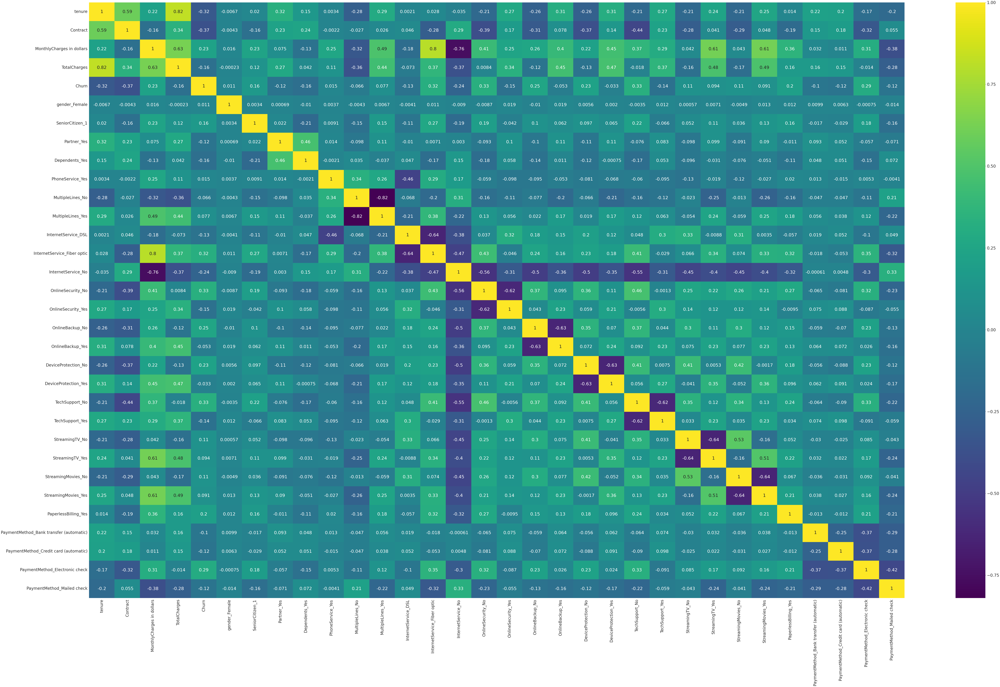

In [ ]:
# plotting the correlation using a heat map after dropping the correlated indpendent variables
plt.figure(figsize = (150,90))
sns.set(font_scale=3)
sns.heatmap(corr, cmap='viridis', annot = True);

## Modelling

In [ ]:
#Spliiting the data into training and testing data
from sklearn.model_selection import train_test_split

X = df_encoded.drop('Churn', axis=1)
y = df_encoded['Churn']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
#Training the model
from sklearn.tree import DecisionTreeClassifier

tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

### Tree Visualization

In [ ]:
#Scoring the model
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(tree_clf, out_file=None,
                           feature_names=X.columns,
                           class_names=['No', 'Yes'],
                           filled=True, rounded=True,
                           special_characters=True) 
graph = graphviz.Source(dot_data)
graph


**Tracing a leaf node**
Starting from the root node, if the contract greater than 0.5, online security is less than 0.5 and monthly charges is ranged between 0.375 and 0.376, then customer will churn --> class = YES 

## Evaluation

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:")
        print("===============================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:")
        print("===============================================")
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [ ]:
print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 99.71%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.996211     0.999230  0.997089     0.997721      0.997097
recall        0.999683     0.990840  0.997089     0.995261      0.997089
f1-score      0.997944     0.995017  0.997089     0.996481      0.997086
support    3156.000000  1310.000000  0.997089  4466.000000   4466.000000
_______________________________________________
Confusion Matrix: 
 [[3155    1]
 [  12 1298]]

Test Result:
Accuracy Score: 72.06%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.808029    0.500917  0.720627     0.654473      0.722070
recall        0.802756    0.509328  0.720627     0.656042      0.720627
f1-score      0.805384    0.505088  0.720627     0.655236      0.721332
support    1379.000000  536.000000  

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


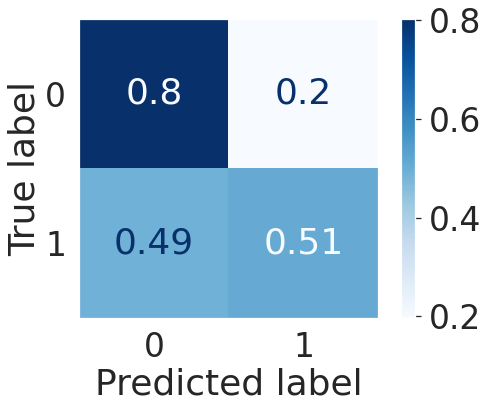

In [ ]:
#plotting the confusion matrix
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(tree_clf, X_test, y_test, cmap='Blues', normalize='true')
plt.grid(False)

In [ ]:
#calculating the evaluation metrics for the model
from sklearn.metrics import f1_score, precision_score, recall_score

pred = tree_clf.predict(X_test)

print('Precision: ',precision_score(y_test,pred))
print('=======================================')
print('Recall: ',recall_score(y_test,pred))
print('=======================================')
print('F1_score: ',f1_score(y_test,pred))

Precision:  0.5009174311926605
Recall:  0.5093283582089553
F1_score:  0.5050878815911194


**Interpretation of results**

The precison is a measure of how much the predicted positive data were actually postive. This model's precison is 0.5 which means that 50% of the predicted positive data are actually postive

Concerning the recall, it measures the ratio between the number of positive samples labled correctly as positive and the total number of positive samples in the dataset. This model's recall is 0.5 which represents 50% of the predicted classes are classified as positive out of the total positive classes in the dataset

As for the f1_score, it is the avergae of precison and recall.

From the data above, it is not recommended to use this model as it generates low percentages of precison, recall and consequently f1_score

## Bonus (Optional)

*Modelling Logistic Regression as another classification method*

In [ ]:
# training the model
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [ ]:
# scoring the model
y_pred = classifier.predict(X_test)

In [ ]:
# evaluting the model using confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

In [ ]:
# evaluting the model using confusion matrix
print ("Confusion Matrix : \n", cm)

Confusion Matrix : 
 [[1230  149]
 [ 250  286]]


In [ ]:
# evalute the model using percision, recall and f1_score
from sklearn.metrics import f1_score, precision_score, recall_score

pred = classifier.predict(X_test)

print('Precision: ',precision_score(y_test,pred))
print('=======================================')
print('Recall: ',recall_score(y_test,pred))
print('=======================================')
print('F1_score: ',f1_score(y_test,pred))

Precision:  0.6574712643678161
Recall:  0.5335820895522388
F1_score:  0.5890834191555098


According to metrics above, it is observed that logistic regression outputs higher precison, recall than decision trees; therefore it is recommended to be chosen